In [16]:
# Package imports
import numpy as np
import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from torchvision import datasets, transforms
from torch.utils.data import ConcatDataset
from sklearn import metrics
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from collections import namedtuple
import imageio
from io import BytesIO
from IPython.display import display, Image
# Relative imports
from guided_diffusion.script_util import (
    NUM_CLASSES,
    model_and_diffusion_defaults,
    create_model_and_diffusion,
)
from tree_ring_utils.optim_utils import *
from tree_ring_utils.io_utils import *
# Project imports
from util import *

# Globals
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
num_gpus = torch.cuda.device_count()

In [17]:
# Experiment setups
dataset_name = 'Tiny-ImageNet'
# All dataset sizes are actually doubled cause there are watermarked counterparts
train_size = 1500
test_size = 500
image_size = 256
num_epochs = 5
learning_rate = 0.005
exp_rand_seed = 0
# Tree-Ring watermark parameters
tree_ring_paras = dict(
    w_channel=2,
    w_pattern='ring',
    w_mask_shape='circle',
    w_radius=10,
    w_measurement='l1_complex',
    w_injection='complex',
    w_pattern_const=0,
)
# Diffusion model parameters
size_64_diffusion_paras = dict(
    image_size=64,
    num_channels=192,
    num_res_blocks=3,
    num_head_channels=64,
    attention_resolutions="32,16,8",
    dropout=0.1,
    class_cond=True,
    resblock_updown=True,
    use_fp16=True,
    use_new_attention_order=True,
    learn_sigma=True,
    diffusion_steps=1000,
    noise_schedule="cosine",
    timestep_respacing="ddim50",
    use_scale_shift_norm=True,
)
size_256_diffusion_paras = dict(
    image_size=256,
    num_channels=256,
    num_res_blocks=2,
    num_head_channels=64,
    attention_resolutions="32,16,8",
    class_cond=True,
    resblock_updown=True,
    use_fp16=True,
    use_new_attention_order=False,
    learn_sigma=True,
    diffusion_steps=1000,
    noise_schedule="linear",
    timestep_respacing="ddim50",
    use_scale_shift_norm=True,
)

In [18]:
# Data loaders
# Two replacements of full ImageNet:
# Tiny-ImageNet (64x64, 200 classes) at https://image-net.org/data/tiny-imagenet-200.zip
# Imagenette (will resize to 256x256, 10 classes) at https://s3.amazonaws.com/fast-ai-imageclas/imagenette2-320.tgz
# Download and decompress under the ./datasets folder

# Load dataset and class names
def load_dataset(dataset_name):
    assert dataset_name in ['Tiny-ImageNet', 'Imagenette']
    # Normalize and unnormalize functions for ImageNet images
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    normalize = transforms.Normalize(mean, std)
    unnormalize = transforms.Normalize((-mean[0]/std[0], -mean[1]/std[1], -mean[2]/std[2]), 
                                   (1/std[0], 1/std[1], 1/std[2]))

    if dataset_name == 'Tiny-ImageNet':
        # Tiny-ImageNet dataset
        data_dir = './datasets/tiny-imagenet-200'
        dataset = datasets.ImageFolder(f'{data_dir}/train', transforms.Compose([
            transforms.ToTensor(), normalize]))
        assert len(dataset) == 100000
        # Tiny-ImageNet class names
        with open('./datasets/tiny-imagenet-200/wnids.txt', 'r') as f:
            wnids = [line.strip() for line in f.readlines()]
        wnid_to_words = {}
        with open('./datasets/tiny-imagenet-200/words.txt', 'r') as f:
            for line in f.readlines():
                wnid, words = line.strip().split('\t')
                wnid_to_words[wnid] = words
        class_names = [wnid_to_words[wnid] for wnid in sorted(wnids)]
        assert len(class_names) == 200
        
    elif dataset_name == 'Imagenette':
        # Imagenette dataset
        data_dir = './datasets/imagenette2-320'
        dataset = datasets.ImageFolder(f'{data_dir}/train', transforms.Compose([
            transforms.Resize(256, interpolation=transforms.InterpolationMode.BILINEAR), transforms.CenterCrop(256),
            transforms.ToTensor(), normalize]))
        assert len(dataset) == 9469
        # Imagenette class names
        class_names = [wnid_to_words[wnid] for wnid in dataset.classes]
        assert len(class_names) == 10

    return dataset, class_names

# Sample images and class names from dataset
def sample_dataset(train_size, test_size, dataset, class_names, prompt_template):
    assert (train_size + test_size) <= len(dataset)
    # Reset random seed
    torch.manual_seed(exp_rand_seed)
    # Random sample without replacement
    indices = torch.randperm(len(dataset))[:train_size+test_size]
    images = [dataset[idx][0] for idx in indices]
    prompts = [prompt_template(class_names[dataset[idx][1]]) for idx in indices]
    return images[:train_size], prompts[:train_size], images[-test_size:], prompts[-test_size:]


dataset, class_names = load_dataset(dataset_name)
train_images, train_prompts, test_images, test_prompts = sample_dataset(
    train_size, test_size, dataset, class_names, 
    prompt_template=lambda x: 'a photo of a ' + x)

In [19]:
# Diffusion models
# Guided diffusion, DDIM with no additional noise, deterministic
# 64x64 at https://openaipublic.blob.core.windows.net/diffusion/jul-2021/64x64_diffusion.pt
# 256x256 at https://openaipublic.blob.core.windows.net/diffusion/jul-2021/256x256_diffusion.pt
# Download and save under ./models folder

# Load diffusion model and weights
def load_diffusion_model(image_size):
    # Support two image sizes
    assert image_size in [64, 256]
    paras = model_and_diffusion_defaults()
    # Update with default parameters, see https://github.com/openai/guided-diffusion
    if image_size == 64:
        paras.update(size_64_diffusion_paras)
    elif image_size == 256:
        paras.update(size_256_diffusion_paras)
    # Initilaize model and load weights
    model, diffusion = create_model_and_diffusion(**paras)
    model.load_state_dict(torch.load(f'./models/{image_size}x{image_size}_diffusion.pt', map_location=device))
    model.to(device)
    # Convert to FP16
    if paras["use_fp16"]:
        model.convert_to_fp16()
    # Set eval flag
    model.eval()
    return model, diffusion


model, diffusion = load_diffusion_model(image_size)

In [20]:
# Tree-Ring watermark functions

# Generation without watermark
def generate_without_watermark(model, diffusion, prompt, image_size, diffusion_seed):
    set_random_seed(diffusion_seed)
    # For this class-conditioned diffusion model, prompts are just class ids
    assert isinstance(prompt, int) and 0 <= prompt < 1000
    # For simplicity, fix batch size to one
    shape = (1, 3, image_size, image_size)
    # Diffusion
    output = diffusion.ddim_sample_loop(model=model,
                                        shape=shape,
                                        noise=torch.randn(*shape, device=device),
                                        model_kwargs=dict(y=torch.tensor([prompt], device=device)),
                                        device=device,
                                        return_image=True)
    # Transform PIL image to tensor and normalize
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean, std)])
    return transform(output[0])

# Create key using a specific random seed
def create_key(key_seed, image_size, tree_ring_paras):
    # Pack dict into namedtuple so that it is compatible with args
    tree_ring_args = namedtuple('Args', list(tree_ring_paras.keys()) + ['w_seed'])(
        **tree_ring_paras, w_seed=key_seed)
    shape = (1, 3, image_size, image_size)
    # Generate key, which is also named the ground truth patch in tree-ring's code
    gt_patch = get_watermarking_pattern(None, tree_ring_args, device, shape)
    return gt_patch

# Generation with tree-ring watermark
def generate_with_watermark(model, diffusion, prompt, key, image_size, tree_ring_paras, diffusion_seed):
    set_random_seed(diffusion_seed)
    assert isinstance(prompt, int) and 0 <= prompt < 1000
    shape = (1, 3, image_size, image_size)
    tree_ring_args = namedtuple('Args', tree_ring_paras.keys())(**tree_ring_paras)
    # Get watermarking mask
    init_latents_w = torch.randn(*shape, device=device)
    watermarking_mask = get_watermarking_mask(init_latents_w, tree_ring_args, device)
    # Inject watermark
    init_latents_w = inject_watermark(init_latents_w, watermarking_mask, key, tree_ring_args)
    # Diffusion
    output = diffusion.ddim_sample_loop(model=model, 
                                        shape=shape,
                                        noise=init_latents_w,
                                        model_kwargs=dict(y=torch.tensor([prompt], device=device)),
                                        device=device,
                                        return_image=True)
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean, std)])
    return transform(output[0])

# Detect and evalaute tree-ring watermark
def detect_with_watermark(non_wm_image, wm_image, key=None, threshold=0.1):
    pass
    # TODO
    # reverse img without watermarking
    # reversed_latents_no_w = diffusion.ddim_reverse_sample_loop(model=model, shape=shape, image=orig_image_no_w_auged, model_kwargs=model_kwargs, device=device)

    # reverse img with watermarking
    # reversed_latents_w = diffusion.ddim_reverse_sample_loop(model=model, shape=shape, image=orig_image_w_auged, model_kwargs=model_kwargs, device=device)

    # eval
    # no_w_metric, w_metric = eval_watermark(reversed_latents_no_w, reversed_latents_w, watermarking_mask, gt_patch, args)


#image_wo = generate_without_watermark(model, diffusion, 1, image_size, 0)
#key = create_key(key_seed=3, image_size=64, tree_ring_paras=tree_ring_paras)
#image_w = generate_with_watermark(model, diffusion, 1, key, image_size, tree_ring_paras, 0)

In [21]:
# Visualization Utilities

# Visualize image grids
def visualize_images(image_tensors, col_headers, row_headers, fontsize=10, normalize_type=None):
    # Unnormalize
    assert normalize_type in ['ImageNet', 'Naive', None] 
    if normalize_type == 'ImageNet':
        mean = [0.485, 0.456, 0.406]
        std = [0.229, 0.224, 0.225]
        normalize = transforms.Normalize(mean, std)
        unnormalize = transforms.Normalize((-mean[0]/std[0], -mean[1]/std[1], -mean[2]/std[2]), 
                                   (1/std[0], 1/std[1], 1/std[2]))
    elif normalize_type == 'Naive':
        mean = [0.5, 0.5, 0.5]
        std = [0.5, 0.5, 0.5]
        normalize = transforms.Normalize(mean, std)
        unnormalize = transforms.Normalize((-mean[0]/std[0], -mean[1]/std[1], -mean[2]/std[2]), 
                                   (1/std[0], 1/std[1], 1/std[2]))
    # Subplot
    num_rows, num_cols = len(image_tensors), len(image_tensors[0])
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols*2, num_rows*2))
    # Show images
    for i in range(num_rows):
        for j in range(num_cols):
            tensor = image_tensors[i][j]
            if normalize_type is not None:
                tensor = unnormalize(tensor)
            img_np = tensor.cpu().clamp(0, 1).permute(1, 2, 0).numpy()
            if num_rows > 1 and num_cols > 1:
                axs[i, j].imshow(img_np)
                axs[i, j].axis('off')
            else:
                ax = axs[i] if num_cols == 1 else axs[j]
                ax.imshow(img_np)
                ax.axis('off')
    # Column headers
    for j, col in enumerate(col_headers):
        fig.text((j + 1) / (num_cols + 0.5), 1.0, col, ha='center', va='center', fontsize=fontsize)
    # Row headers
    for i, row in enumerate(row_headers):
        fig.text(0, (num_rows - i - 0.5) / num_rows, row, ha='right', va='center', fontsize=fontsize)
    # Plot and show
    plt.tight_layout()
    plt.subplots_adjust(top=0.95, left=0.1)
    # plt.show()
    return fig

# Visualize a dataset and check class names
def visualize_datasets(dataset, class_names, W=5, H=5):
    image_tensors = [[dataset[next(idx for idx, (_, label) in enumerate(dataset.imgs) 
                                   if label == cid) + sid][0] for sid in range(W)] for cid in range(H)]
    col_headers = ['Real Sample '+str(sid+1) for sid in range(W)]
    row_headers = [class_names[cid] for cid in range(H)]
    visualize_images(image_tensors, col_headers, row_headers, fontsize=10)

# Visualize image and prompt pairs
def visualize_images_and_prompts(images, prompts, W=3, H=1):
    visualize_images([images[:W]], prompts[:W], ['Images'], fontsize=6)


#visualize_datasets(dataset, class_names)
#visualize_images_and_prompts(train_images, train_prompts)

/tmp/ipykernel_41905/1632456807.py:43: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image_list.append(imageio.imread(buf))  # read image from the stream


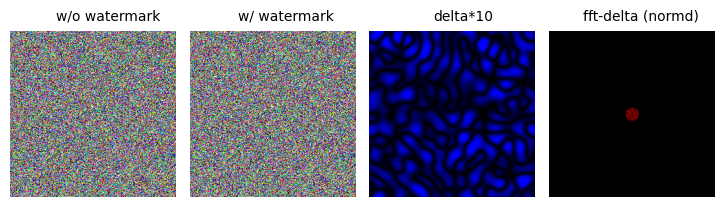

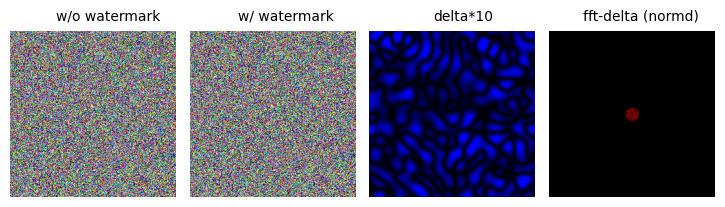

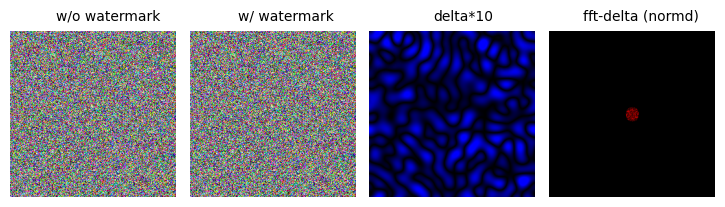

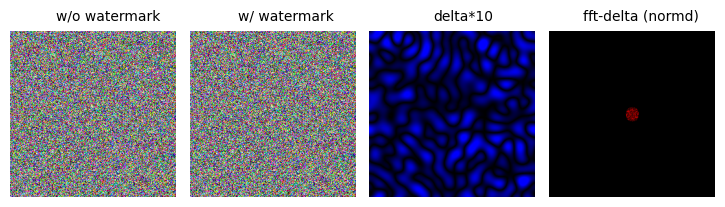

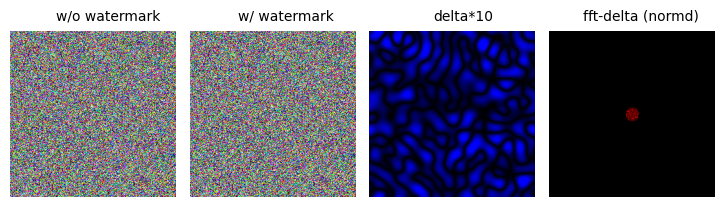

...

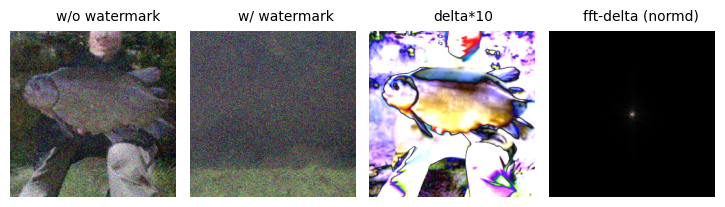

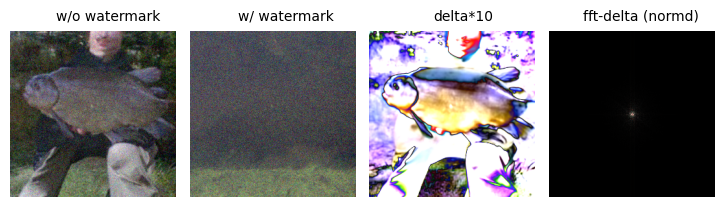

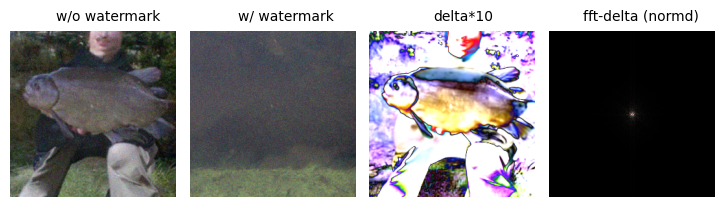

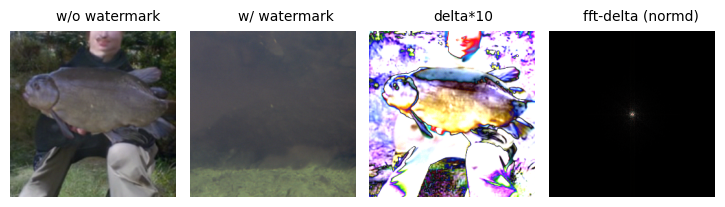

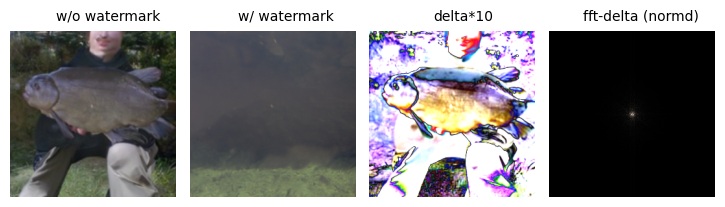

In [22]:
# Visualizing the evolution of tree-ring watermark through diffusion


def generate_and_compare(model, diffusion, prompt, key, image_size, tree_ring_paras, 
                         init_latents_w, watermarking_mask, diffusion_seed):
    set_random_seed(diffusion_seed)
    # For this class-conditioned diffusion model, prompts are just class ids
    assert isinstance(prompt, int) and 0 <= prompt < 1000
    # For simplicity, fix batch size to one
    shape = (1, 3, image_size, image_size)
    tree_ring_args = namedtuple('Args', tree_ring_paras.keys())(**tree_ring_paras)
    # Unnormalize for 
    mean = [0.5, 0.5, 0.5]
    std = [0.5, 0.5, 0.5]
    unnormalize = transforms.Normalize((-mean[0]/std[0], -mean[1]/std[1], -mean[2]/std[2]), 
                                       (1/std[0], 1/std[1], 1/std[2]))
    # Diffusion w/o watermark
    no_wm_iter = diffusion.ddim_sample_loop_progressive(
        model=model, shape=shape, noise=init_latents_w, 
        clip_denoised=True,
        model_kwargs=dict(y=torch.tensor([prompt], device=device)), device=device)
    # Diffusion w watermark
    wm_iter = diffusion.ddim_sample_loop_progressive(
        model=model, shape=shape, noise=inject_watermark(init_latents_w, watermarking_mask, key, tree_ring_args),
        clip_denoised=True,
        model_kwargs=dict(y=torch.tensor([prompt], device=device)), device=device)
    # Main loop
    image_list = []
    for no_wm_sample, wm_sample in zip(no_wm_iter, wm_iter):
        fft_diff = torch.abs(torch.fft.fftshift(torch.fft.fft2(
            unnormalize(no_wm_sample['sample'][0])-unnormalize(wm_sample['sample'][0]))))
        fft_diff = fft_diff/fft_diff.max()
        fig = visualize_images([[
            unnormalize(no_wm_sample['sample'][0]), 
            unnormalize(wm_sample['sample'][0]), 
            torch.abs(unnormalize(no_wm_sample['sample'][0])-unnormalize(wm_sample['sample'][0]))*10,
            fft_diff,
        ]], ['w/o watermark', 'w/ watermark', 'delta*10', 'fft-delta (normd)'], [''], fontsize=10)

        buf = BytesIO()  # in-memory binary stream
        fig.savefig(buf, format="png", dpi=200, bbox_inches='tight') # save figure to the stream in PNG format
        buf.seek(0)
        image_list.append(imageio.imread(buf))  # read image from the stream
        plt.show(fig)
        plt.close(fig)
    imageio.mimsave('vis.gif', image_list, loop=1, duration=0.5)
    return None


set_random_seed(0)
key = create_key(key_seed=0, image_size=image_size, tree_ring_paras=tree_ring_paras)
shape = (1, 3, image_size, image_size)
tree_ring_args = namedtuple('Args', tree_ring_paras.keys())(**tree_ring_paras)
init_latents_w = torch.randn(*shape, device=device)
watermarking_mask = get_watermarking_mask(init_latents_w, tree_ring_args, device=device)
generate_and_compare(model, diffusion, 0, key, image_size, tree_ring_paras, init_latents_w, watermarking_mask, 0)

In [23]:
# Train watermark detector

def train_detector(dataloader):
    # Load pretrained model
    model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
    model.to(device)
    # Define optimizer and criterion
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.CrossEntropyLoss()
    # Unnormalize the image
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    unnormalize = transforms.Normalize((-mean[0]/std[0], -mean[1]/std[1], -mean[2]/std[2]), 
                                       (1/std[0], 1/std[1], 1/std[2]))
    # Train loop
    for epoch in tqdm(range(num_epochs), desc="Train Classifier"):
        model.train()
        total_loss = 0.0
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
    
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
    
            total_loss += loss.item()
    
        average_loss = total_loss / len(dataloader)
        #print(f"Epoch [{epoch+1}/{num_epochs}] Loss: {average_loss:.4f}")
    return model